# Setup

In [8]:
import pandas as pd
import numpy as np
import sweetviz as sv

In [9]:
data = pd.concat([pd.read_csv("../data/clean/train.csv"),
                  pd.read_csv("../data/clean/test.csv")]).reset_index(drop=True)

# Data profiling

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72739 entries, 0 to 72738
Data columns (total 43 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   host_response_rate                            65965 non-null  float64
 1   host_acceptance_rate                          66597 non-null  float64
 2   latitude                                      72739 non-null  float64
 3   longitude                                     72739 non-null  float64
 4   accommodates                                  72739 non-null  int64  
 5   bathrooms                                     72718 non-null  float64
 6   bedrooms                                      72567 non-null  float64
 7   beds                                          72515 non-null  float64
 8   price                                         72739 non-null  float64
 9   minimum_nights                                72739 non-null 

In [11]:
# Numerical features
data.describe(include=['int64','float64'],
              percentiles=[0.01]+np.arange(0.1,1,0.1).tolist()+[0.99]).T

,count,mean,std,min,1%,10%,20%,30%,40%,50%,60%,70%,80%,90%,99%,max
host_response_rate,65965.0,95.893019,15.489104,0.000000,0.000000,92.000000,99.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000
host_acceptance_rate,66597.0,88.525504,21.428897,0.000000,0.000000,64.000000,83.000000,92.000000,96.000000,98.000000,99.000000,100.000000,100.000000,100.000000,100.000000,100.00000
latitude,72739.0,34.002513,2.997901,30.097450,30.196625,30.286110,32.734058,32.796360,33.771102,33.993103,34.047783,34.086027,34.139844,41.764362,41.967421,42.02220
longitude,72739.0,-110.288256,11.438353,-118.917134,-118.640056,-118.444862,-118.373404,-118.314606,-118.189719,-117.892080,-117.168598,-97.784765,-97.704548,-87.752817,-87.616778,-87.52842
accommodates,72739.0,4.575757,3.185178,1.000000,1.000000,2.000000,2.000000,2.000000,3.000000,4.000000,4.000000,6.000000,6.000000,8.000000,16.000000,16.00000
bathrooms,72718.0,1.635276,1.109639,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.500000,2.000000,2.000000,3.000000,6.000000,50.00000
bedrooms,72567.0,1.862568,1.377400,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,3.000000,4.000000,6.000000,50.00000
beds,72515.0,2.439716,2.165706,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,3.000000,4.000000,5.000000,10.000000,132.00000
price,72739.0,283.583016,670.223217,5.000000,32.000000,63.000000,87.000000,110.000000,132.000000,159.000000,194.000000,240.000000,319.000000,500.000000,2103.720000,56425.00000
minimum_nights,72739.0,13.177745,21.906856,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,3.000000,4.000000,30.000000,30.000000,31.000000,60.000000,1000.00000


In [12]:
# Categoriacal features
data.describe(include=['object']).T

,count,unique,top,freq
host_response_time,65965,4,within an hour,53510
property_type,72739,33,entire home,21773
room_type,72739,4,entire home/apt,58660
state,72739,3,california,48950
city,72739,5,los angeles,37296


# Descriptive analysis

__Note:__ If the following cells are not showing properly, open the `exploratory_data_analysis.html` file in a web browser.

The following summaries include various statistics about each feature and even show their relationship with the target variable. Moreover, the detailed summary of the target variable shows feature importance rankings for both numerical and categorical features.

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:03 -> (00:00 left)        



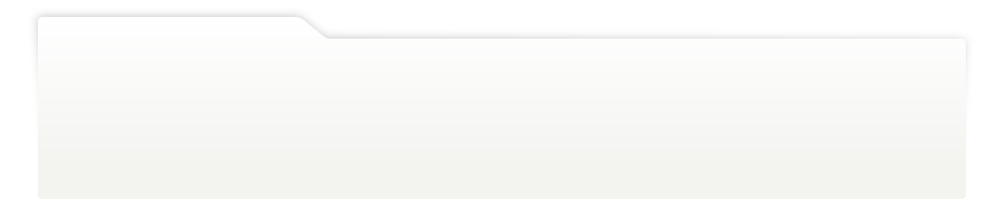
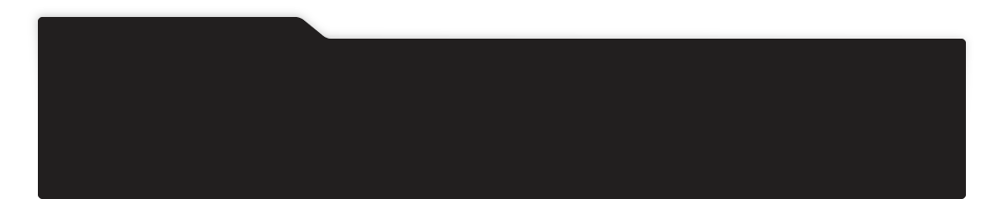
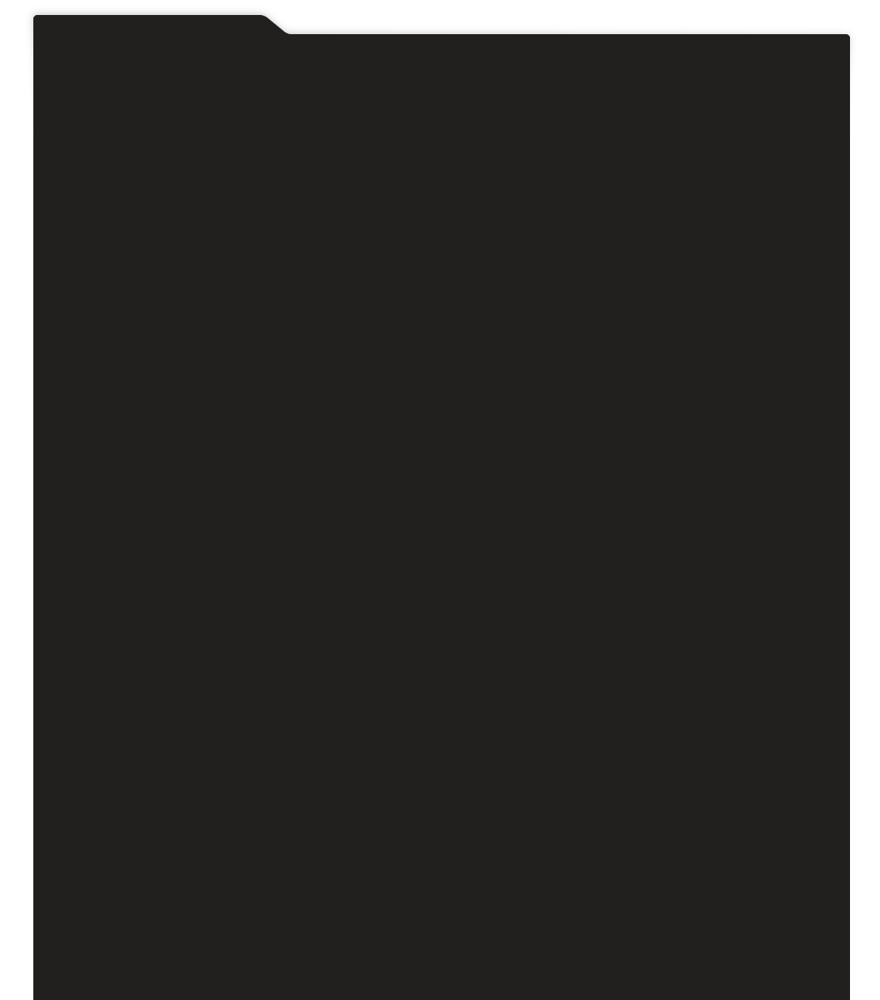
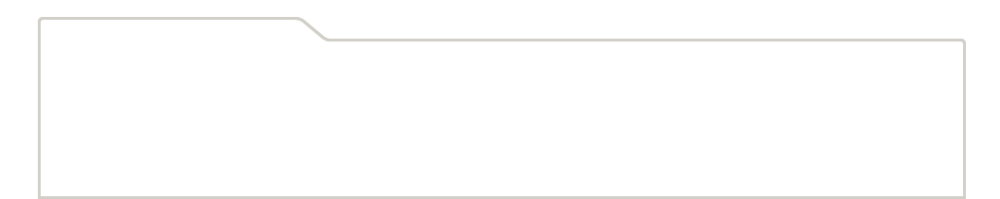
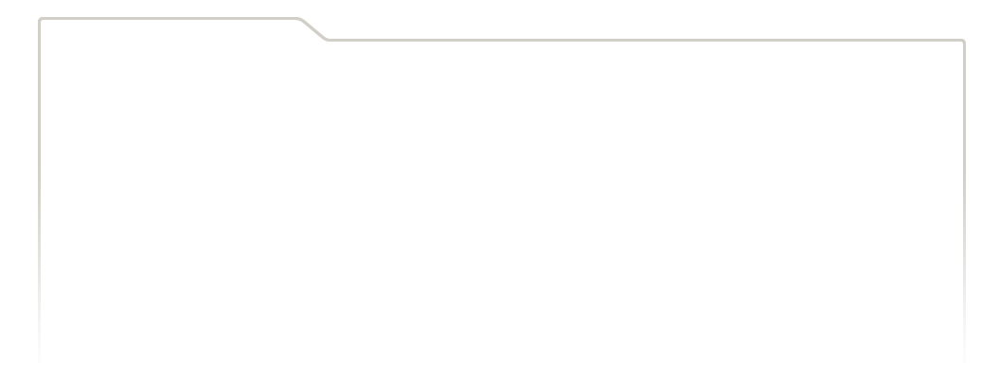
...
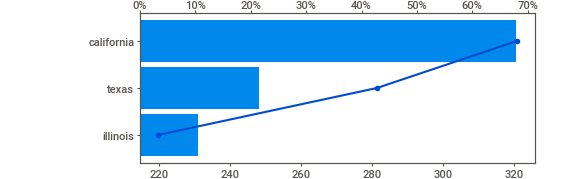
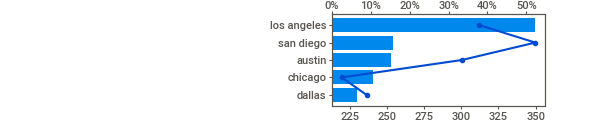
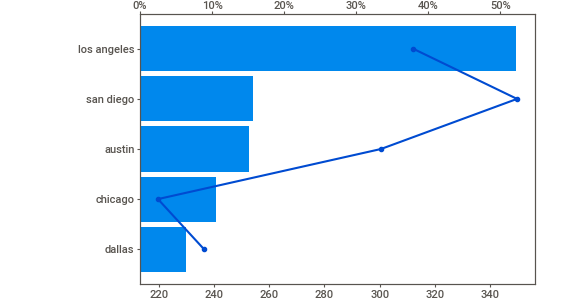
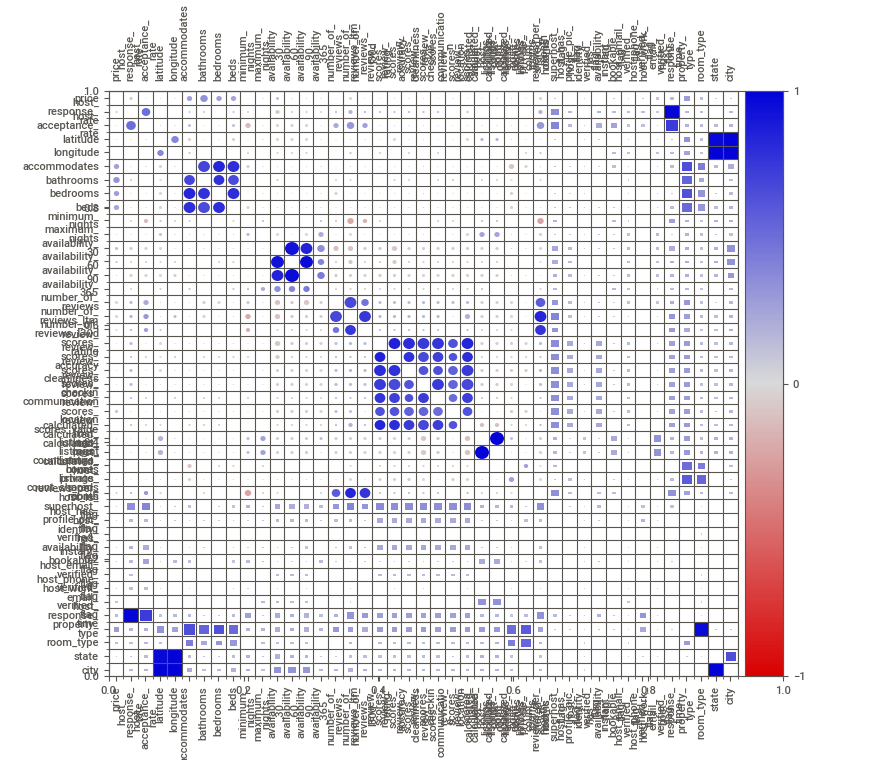
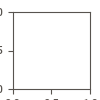

In [13]:
report = sv.analyze(data.sample(frac=0.1, random_state=123), target_feat='price')
report.show_notebook()

Since price follows an exponential distribution, let's apply a log10 transformation to double-check its relationship with the predictor variables

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:02 -> (00:00 left)        



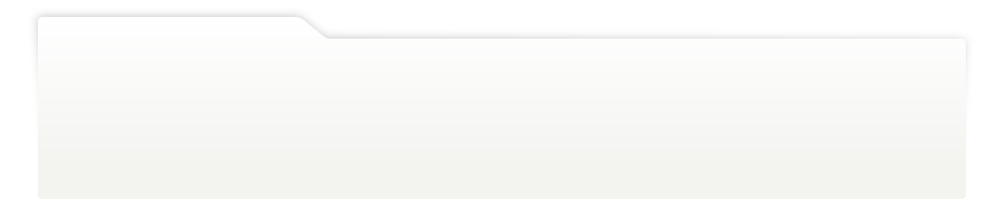
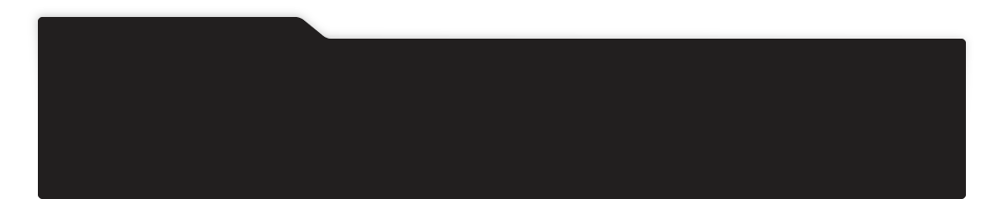
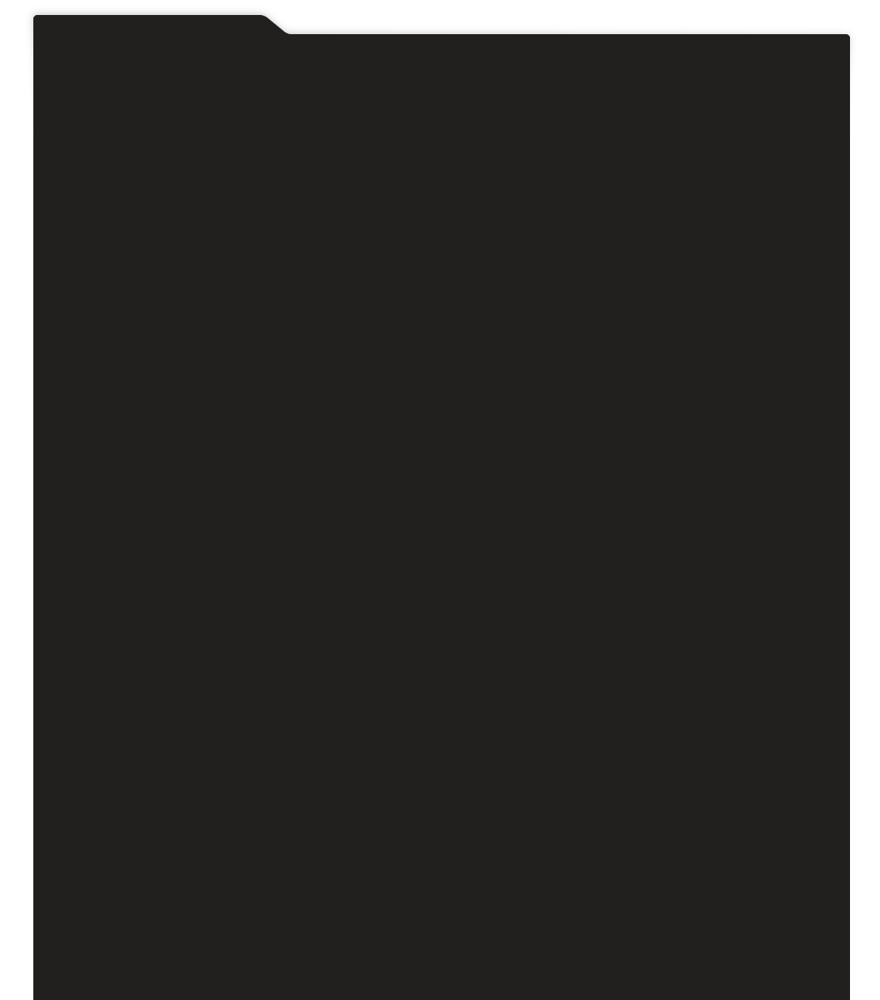
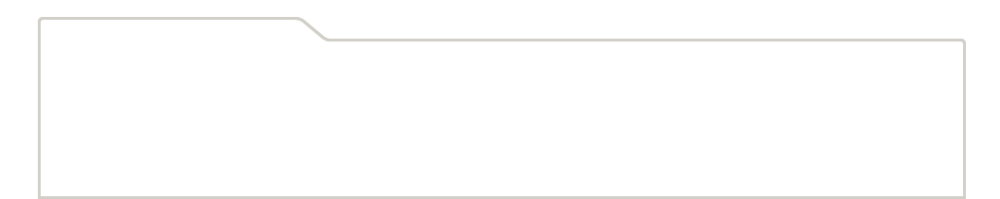
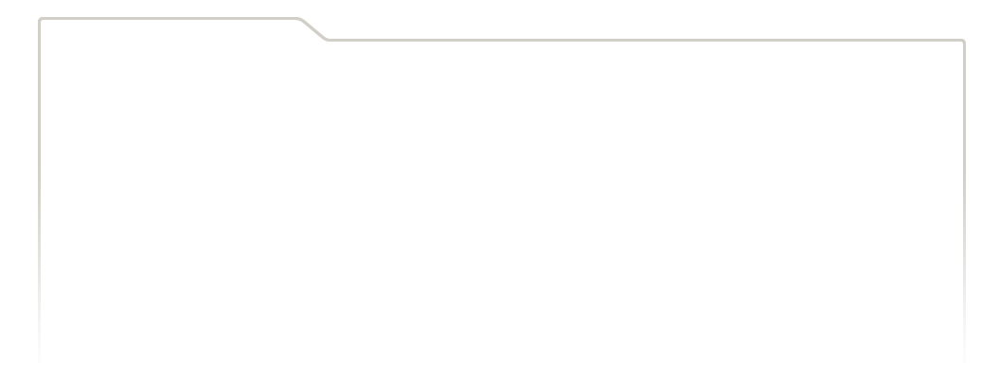
...
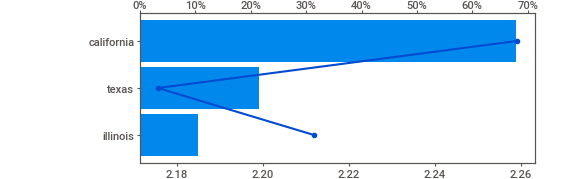
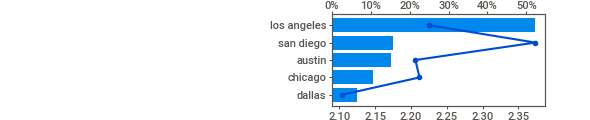
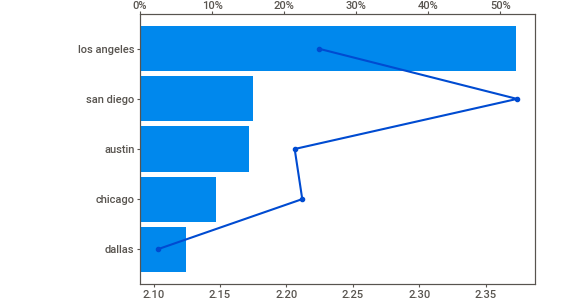
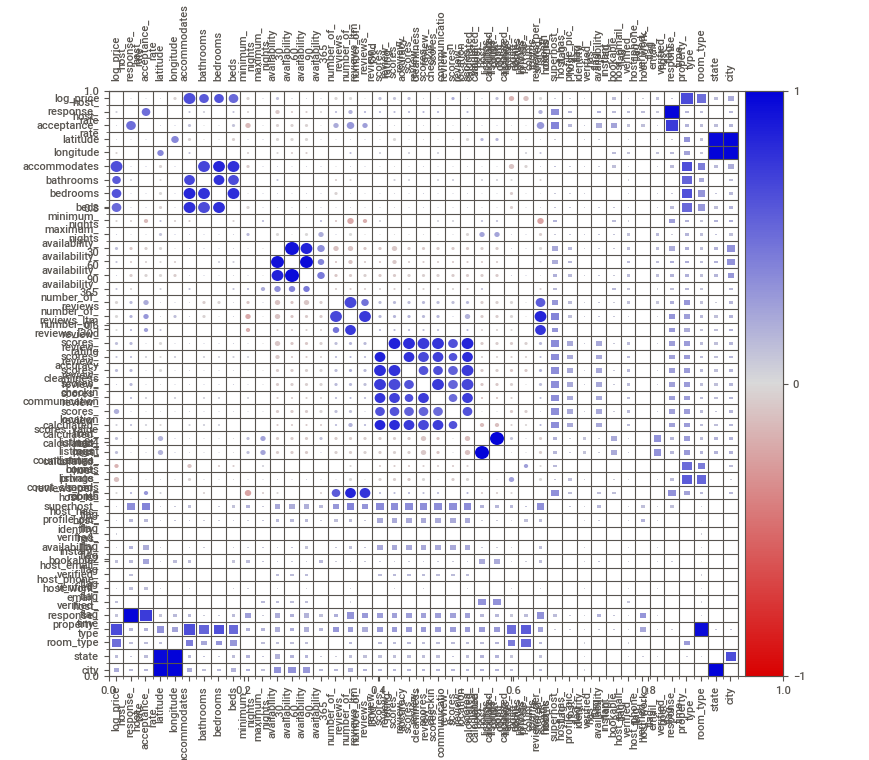
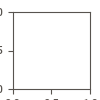

In [14]:
# Transform price using log10
data_log_price = data.copy()
data_log_price['log_price'] = np.log10(data_log_price['price'])
data_log_price.pop('price')

report = sv.analyze(data_log_price.sample(frac=0.1, random_state=123), target_feat='log_price')
report.show_notebook()